## Visualisations with matplotlib, seaborn and plotly

## Importing packages and data


In [1]:
# %pip install seaborn 
# %pip install plotly 

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import seaborn as sns
import plotly.express as px



In [3]:
pd.options.display.float_format = '{:.2f}'.format

In [4]:
travel_dataset = pd.read_csv("data/output/travel_dataset_cleaned.csv")

## Phases and principles 

When dealing with data, there's a journey we often embark on:

1. **Exploratory Phase (Exploratory Data Analysis)**: 
   - **What it is**: At this stage, we're diving into the data, much like a researcher in a lab. We're experimenting, testing hypotheses, and analyzing patterns. It's a phase of discovery, and sometimes it gets technical and intricate.
   - **Who it's for**: Primarily for those who are closely working with the data, like data scientists and analysts. It's about understanding, not necessarily communicating.
   - **Visuals**: Charts and graphs here can be detailed and complex because they serve as tools for understanding.

2. **Presentation Phase (Explanatory Data Visualization)**: 
   - **What it is**: Once we've gained insights from our exploration, it's time to share them. Think of this as distilling our findings into a clear message or story.
   - **Who it's for**: A wider audience, which could include stakeholders, team members, or anyone who needs to understand the main takeaways.
   - **Visuals**: Here, simplicity and clarity take the front seat. The visuals are designed to be understood quickly and should align with the principles of clarity, simplicity, accuracy, and relevance.

In short, the process starts with a deep dive into the data for insights and ends with a clear, concise presentation of those insights for everyone to grasp.

In the case of explanatory data analysis the following four principles hold:

1. **Clarity**: The main goal is to convey insights in a way that's immediately understandable. If you have to spend too much time figuring out what a chart is saying, then it's not doing its job.

2. **Simplicity**: The most effective visuals are often the simplest. It's about getting the message across, not showing off fancy graphics.

3. **Accuracy**: It's vital to represent data truthfully. Misleading visuals not only harm credibility but can also lead to wrong conclusions.

4. **Relevance**: Every piece of information on your visual should serve a purpose. If it doesn't help convey the main insight, consider removing it.

With these principles in mind, our aim in this lab is to create visuals that stand on their own and communicate effectively. We want every chart or graph to be so intuitive that it needs little to no explanation.

## Univariate plotting with matplotlib

The syntax for plotting is generally `plt.<plotType>(x, y)`. 

When using Matplotlib, plots are made on a `Figure` object. A `Figure` object can contain multiple `Axes`. `Axes` are the things you are plotting on. THere are more elements than this, but for the scope of this course this is enough to get started. We will explicitly make a `Figure` and plot on the axis. This allows us to configure the `Figure`.

#### Different types of plots

##### Numeric Data

| Plot Type          | Description                                           | When to Use                                                      |
|--------------------|-------------------------------------------------------|------------------------------------------------------------------|
| **Histogram**      | Displays the distribution of a single continuous variable by dividing the data into bins and showing the frequency of observations in each bin. | To visualize the distribution of a variable, especially to identify its central tendency (mean), spread (standard deviation), and skewness (are low or high values more common).  |
| **Box Plot (or Whisker Plot)** | Shows the distribution of a variable using quartiles and displays potential outliers. | To get a summary of a variable's distribution in terms of its median, quartiles, and possible outliers. Useful when comparing the distribution across categories. |
| **Density Plot (or Kernel Density Plot)** | Provides a smoothed version of a histogram. | To visualize the distribution of a variable in a continuous manner. Particularly useful when comparing the distributions of multiple variables on the same plot. |
| **Violin Plot**    | Combines aspects of box plots and density plots.       | To visualize both the distribution and summary statistics of a variable. Especially useful when comparing across different categories. |

##### Categorical Data

For categorical data, categories can often serve as a basis for comparison in other plots, like boxplots. This means you can use a single category to differentiate data within such plots. You can also produce the same type of plot multiple times, once for each category, to analyze patterns within individual categories.


| Plot Type     | Description                                          | When to Use                                         |
|---------------|------------------------------------------------------|-----------------------------------------------------|
| **Count Plot**| Represents the frequency or count of each category.  | To see how often each category appears in the data. |


#### Plots

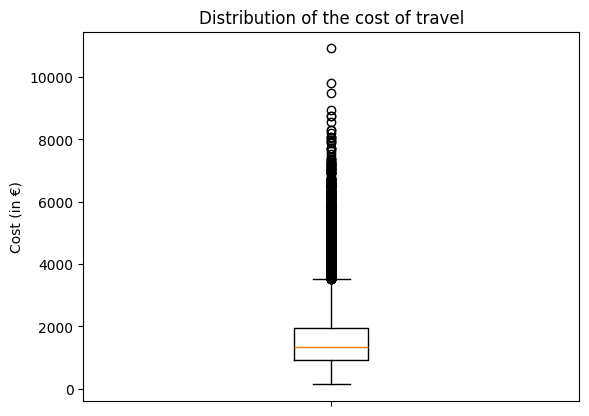

In [5]:
fig, ax = plt.subplots() # Notice the S, subplots not subplot.
ax.boxplot(travel_dataset["cost"])
ax.set_title("Distribution of the cost of travel")
ax.set_ylabel("Cost (in €)")
ax.set_xlabel("")
ax.set_xticklabels("");

We can also have multiple axes in a figure. We can do that by specifying the rows and columns in `plt.subplots()`.

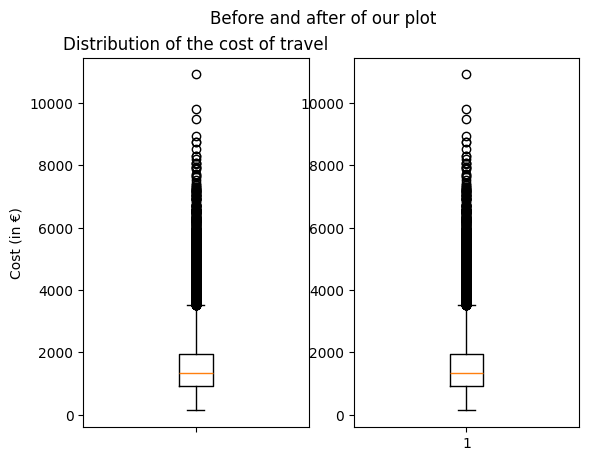

In [6]:
fig, ax = plt.subplots(nrows=1, ncols=2)
fig.suptitle("Before and after of our plot")
ax[0].boxplot(travel_dataset["cost"])
ax[0].set_title("Distribution of the cost of travel")
ax[0].set_ylabel("Cost (in €)")
ax[0].set_xlabel("")
ax[0].set_xticklabels("");
ax[1].boxplot(travel_dataset["cost"]);

Notice how adding `nrows` and `ncols` turns our `Axes` into a (Numpy) array. To plot we simply index the right one and plot. The next step we need to do is make our plot larger. That is done by using the `figsize` argument in `plt.subplots`. 

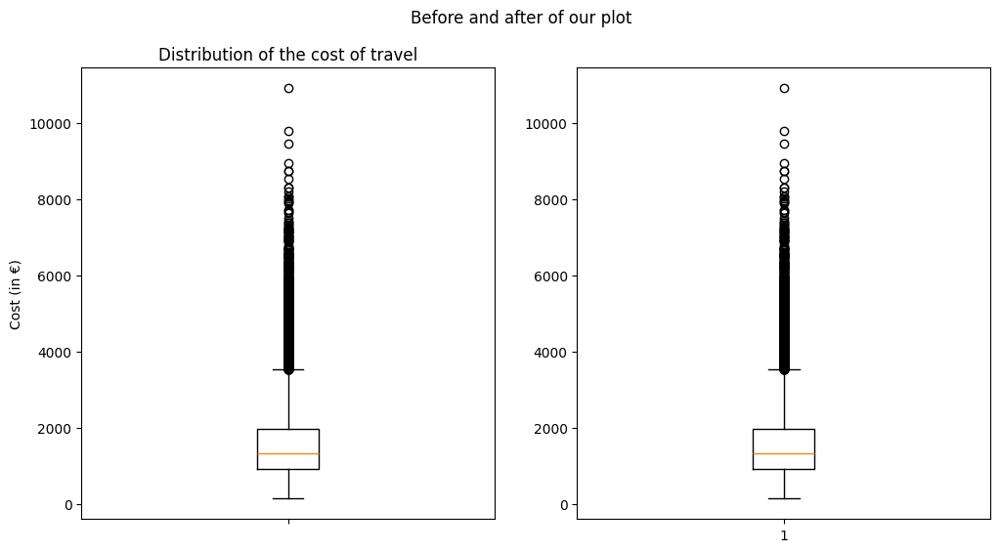

In [7]:
fig, ax = plt.subplots(1,2, figsize=(12, 6))
fig.suptitle("Before and after of our plot")
ax[0].boxplot(travel_dataset["cost"])
ax[0].set_title("Distribution of the cost of travel")
ax[0].set_ylabel("Cost (in €)")
ax[0].set_xlabel("")
ax[0].set_xticklabels("");
ax[1].boxplot(travel_dataset["cost"]);

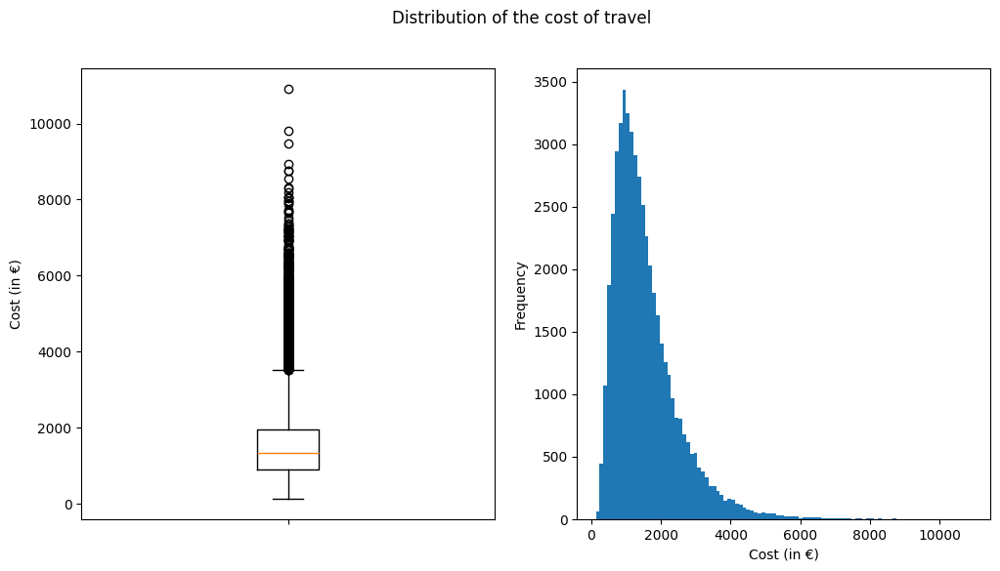

In [8]:
fig, ax = plt.subplots(1,2, figsize=(12, 6))
fig.suptitle("Distribution of the cost of travel")
ax[0].boxplot(travel_dataset["cost"])
ax[0].set_ylabel("Cost (in €)")
ax[0].set_xlabel("")
ax[0].set_xticklabels("");
ax[1].hist(travel_dataset["cost"], bins=100)
ax[1].set_ylabel("Frequency")
ax[1].set_xlabel("Cost (in €)");


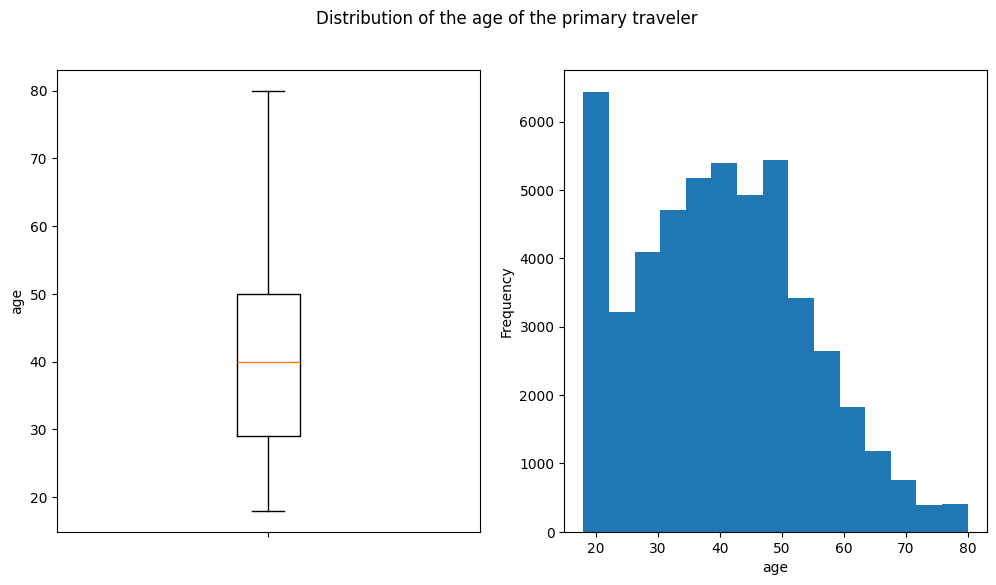

In [9]:
fig, ax = plt.subplots(1,2, figsize=(12, 6))
fig.suptitle("Distribution of the age of the primary traveler")
ax[0].boxplot(travel_dataset["age"])
ax[0].set_ylabel("age")
ax[0].set_xlabel("")
ax[0].set_xticklabels("");
ax[1].hist(travel_dataset["age"], bins=15)
ax[1].set_ylabel("Frequency")
ax[1].set_xlabel("age");


There is an additional way to make that you can use if you do not want to interact directly with Matplotlib. Selecting data with Pandas and using `.plot()` will make a similar plot with less effort. It's still important to know the fundamentals of Matplotlib because it still uses it under the hood and customization may still require using the subplots API. We will show you two styles of interacting with it.

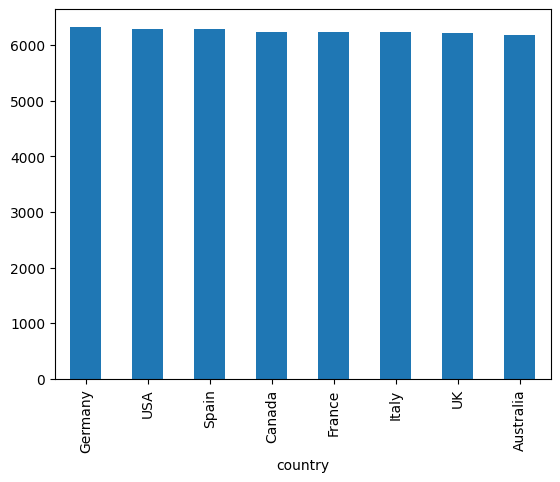

In [10]:
travel_dataset["country"].value_counts().plot(kind="bar");

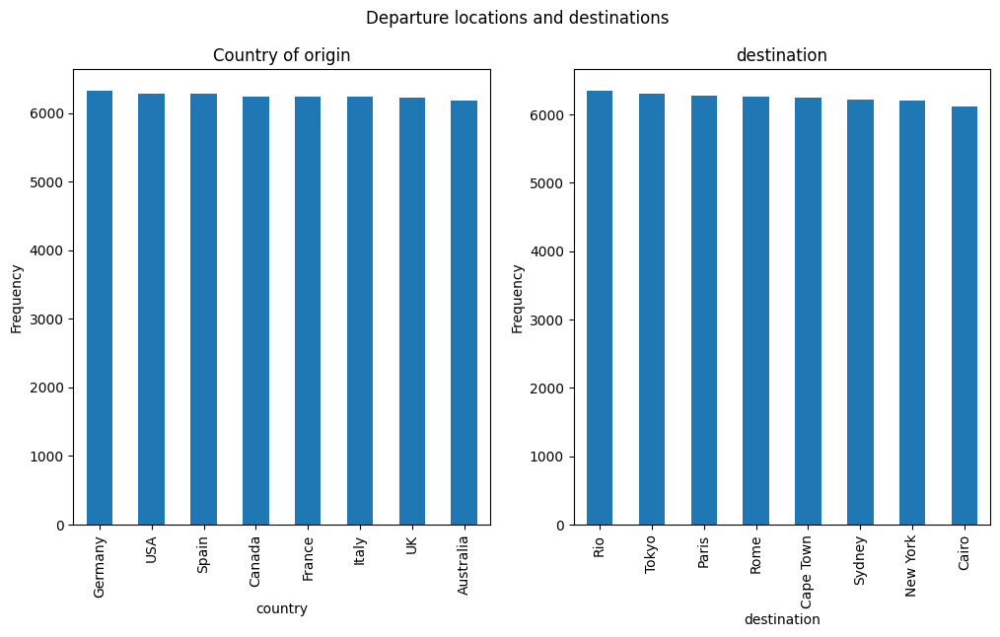

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle("Departure locations and destinations")
ax[0].set_title("Country of origin")
ax[0].set_ylabel("Frequency")
travel_dataset["country"].value_counts().plot(kind="bar", ax=ax[0])
travel_dataset["destination"].value_counts().plot(kind="bar", title="destination", ax=ax[1], ylabel="Frequency");

## Bivariate plotting with Seaborn

Seaborn is the next plotting library we will use. It should be your go-to in the Python, especially if you're using Pandas. It was specifically built with the Pandas library and data analysis in mind. It makes doing certain plots a lot easier and has a number of sensible defaults (e.g., colors) that are better than Matplotlib. At the end of the day, it is fully built on top of Matplotlib so everything we have learn about customization still holds. We will continue our analysis using Seaborn and see how it can aid us in specifically bivariate and multivariate analysis.

#### Different types of plots

##### Numeric Data

| Plot Type          | Description                                           | When to Use                                                      |
|--------------------|-------------------------------------------------------|------------------------------------------------------------------|
| **Scatter Plot**   | Displays values for two variables for a set of data using dots. | To identify relationships or correlations between two numeric variables. |
| **Hexbin Plot**    | Groups points into hexagonal bins and colors them based on the count of points in each bin. | When there's a large amount of data that may overlap in a scatter plot. Useful for visualizing density and relationships between two numeric variables. |
| **Line Plot**      | Connects data points with lines. Typically used for **time series data**. | To visualize trends over time or the relationship between two numeric variables when there's an ordering to the data points. Do not use this if there's no possible observations between the lines. |
| **Joint Plot**     | Combines scatter plots with histograms for each variable. | To view the relationship between two numeric variables and their individual distributions simultaneously. |

##### Categorical data 


| Plot Type          | Description                                           | When to Use                                                      |
|--------------------|-------------------------------------------------------|------------------------------------------------------------------|
| **Contingency Table (or Cross Tabulation)** | Shows the frequency of combinations of categories. | To summarize the relationship between two categorical variables in tabular form. |


Imagine you have a lot of similar data points from different categories, and you want to compare them side by side. This is where the magic of small multiples and colour-coding comes into play.

**Small Multiples**

Small multiples are a series of similar graphs or charts using the same scale and axes, allowing them to be easily compared. They divide data by categories and present each category in its own panel within a larger visualization.

Why use Them?

1. Consistency: Because each graph uses the same scale and axes, it's easy to compare data across categories directly.
2. Clarity: By separating data into individual panels, the viewer can clearly see patterns or trends within each category without them being obscured by other data.
3. Efficiency: Instead of toggling between different views or using interactive tools to sift through data, viewers get a simultaneous snapshot of all categories at once.

Remember:

The general idea behind small multiples is consistency in presentation but separation in data. By creating one graph per category, you're allowing your audience to quickly and efficiently draw insights from a collective set of data points, making your presentation both comprehensive and comprehensible.

**Color-Coding**

Sometimes, when we have multiple categories of data, it can be effective to display them all on one graph, using color as a key differentiator. 

Why Use Color-Coding?

1. Unified View: One of the main advantages of using color is that it presents all the categories in a single, unified plot. This can provide a holistic view and show interactions or overlaps between categories.
 
2. Space Efficiency: Instead of dividing your canvas into multiple sections, color-coding allows you to utilize the entire space for a singular, impactful visualization.

3. Quick Comparisons: With the right color choices, the eye can quickly discern between categories and compare their relative positions or values.

When is Color-Coding Useful?

1. Limited Categories: Color-coding works best when the number of categories is limited. If there are too many categories, the plot can become cluttered and colors hard to distinguish.

2. Overlapping Data Points: If you're interested in seeing where data points from different categories intersect or overlap, using color on a single plot can be very effective.

3. Emphasis on Relationships: When the relationship or interaction between categories is more important than individual category trends, a color-coded unified plot can be invaluable.


**Comparison with Small Multiples**: 

While small multiples separate data by categories into individual panels for clarity, color-coded plots display all data on one graph for a unified perspective. The choice between them often depends on the specific goals of the visualization and the nature of the data.

#### Plots "Numeric data"

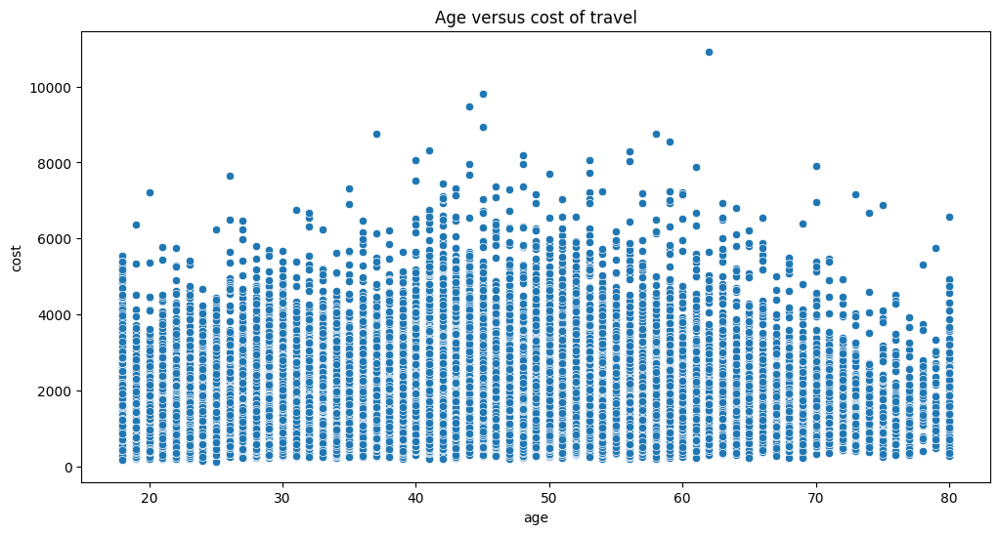

In [12]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_title("Age versus cost of travel")
sns.scatterplot(travel_dataset, x="age", y="cost", ax=ax);

A a glance we can see that Seaborn comes with a number of sensible defaults:

1. The x and y-axis are labeled
2. Generally the colors look a bit easier on the eyes than matplotlib.

It also has plot types that do not exist natively in Matplotlib such as `sns.countplot` and `sns.jointplot`.

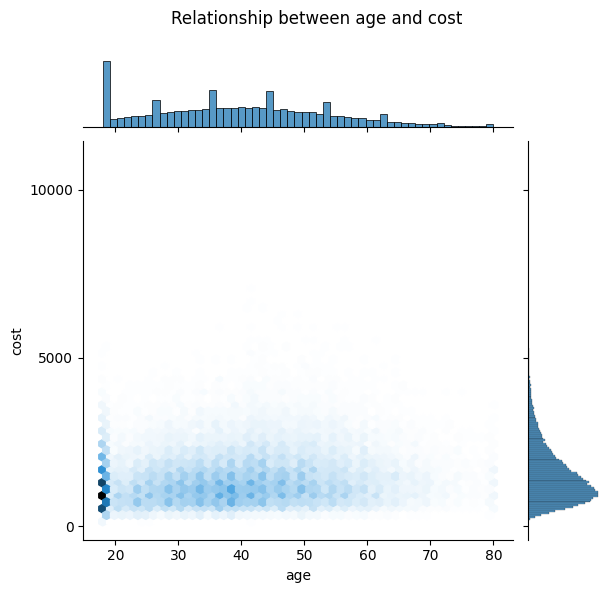

In [13]:
g = sns.jointplot(travel_dataset, x="age", y="cost", kind="hex");
g.figure.subplots_adjust(top=0.9) # Add some spacing 
g.figure.suptitle("Relationship between age and cost")
g.ax_joint.yaxis.set_major_locator(ticker.MultipleLocator(5000)) # This is how to increase the tick frequency 

Notice how Seaborn sometimes returns objects that wrap Matplotlib `Figure`s and `Axes`. It's a higher level interface to Matplotlib so we still need to dip into the lower level interface to do certain things.

#### Plots "Categorical Data"

<Axes: title={'center': 'The number of visitors per destination'}, xlabel='country', ylabel='count'>

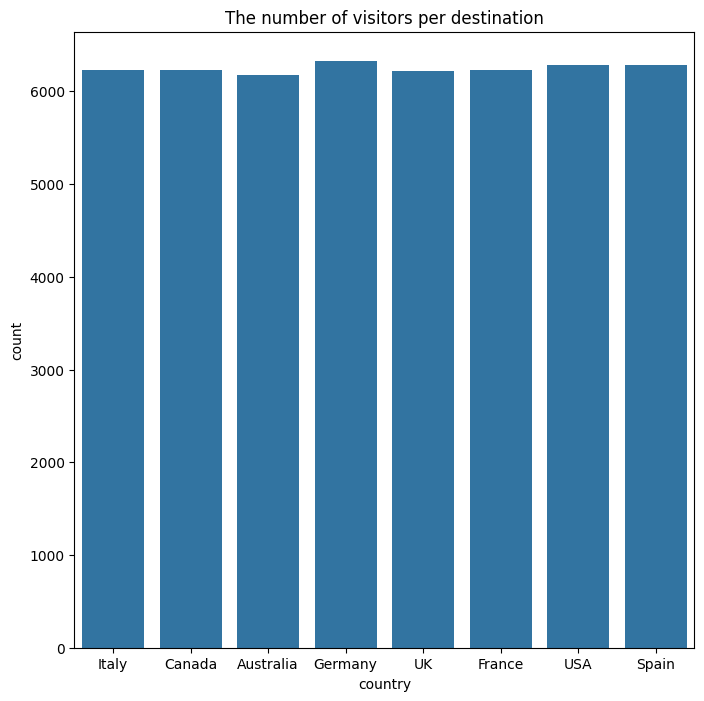

In [14]:
fig, ax = plt.subplots(figsize=(8,8))
ax.set_title("The number of visitors per destination")
sns.countplot(data=travel_dataset, x="country",ax=ax)

<Axes: title={'center': 'Counts for countries and destinations'}, xlabel='country', ylabel='destination'>

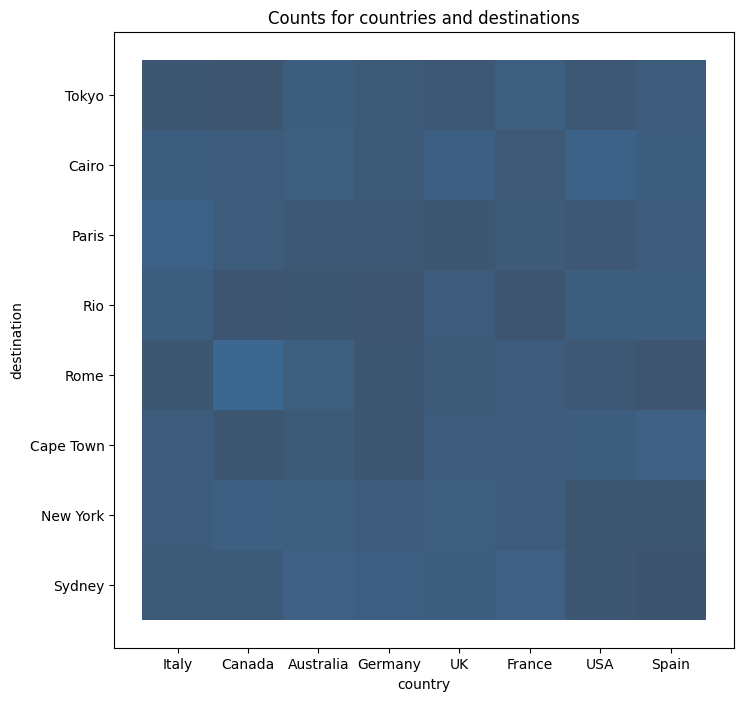

In [15]:
fig, ax = plt.subplots(figsize=(8,8))
ax.set_title("Counts for countries and destinations")
sns.histplot(data=travel_dataset, x="country", y="destination", legend=True, ax=ax)

#### Plots "small multiples"

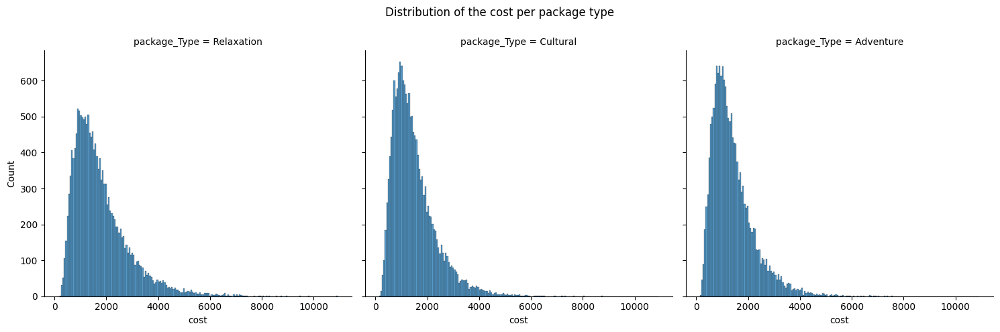

In [16]:
# create small multiples
g = sns.displot(travel_dataset, x="cost", col="package_Type")
g.figure.suptitle("Distribution of the cost per package type")
g.figure.subplots_adjust(top=0.85)

<Axes: title={'center': 'Distribution of cost per country'}, xlabel='country', ylabel='cost'>

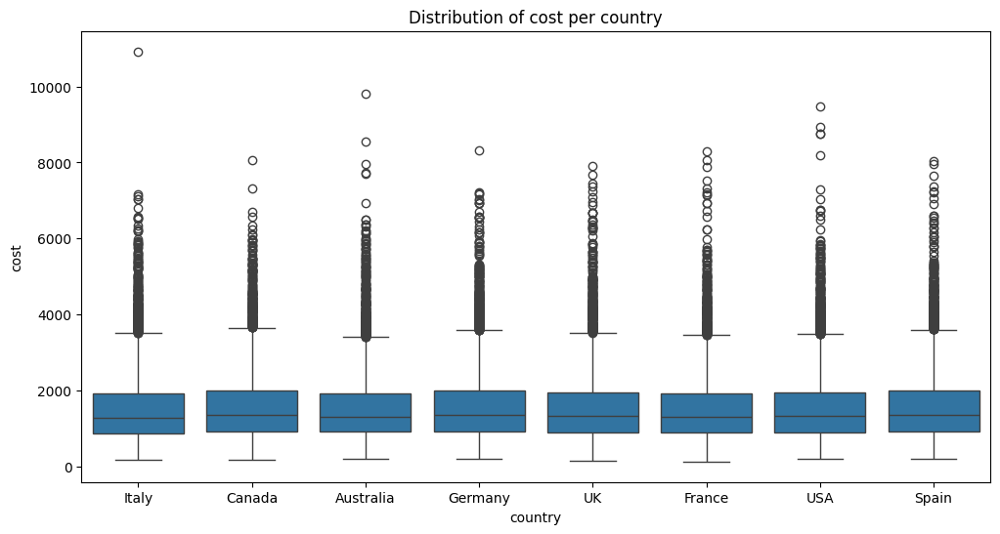

In [17]:
fig, ax = plt.subplots(figsize=(12,6))
ax.set_title("Distribution of cost per country")
sns.boxplot(travel_dataset, x="country", y="cost",ax=ax)

#### Plots "Color-coding"

<Axes: title={'center': 'Distribution of cost per package type'}, xlabel='cost', ylabel='Count'>

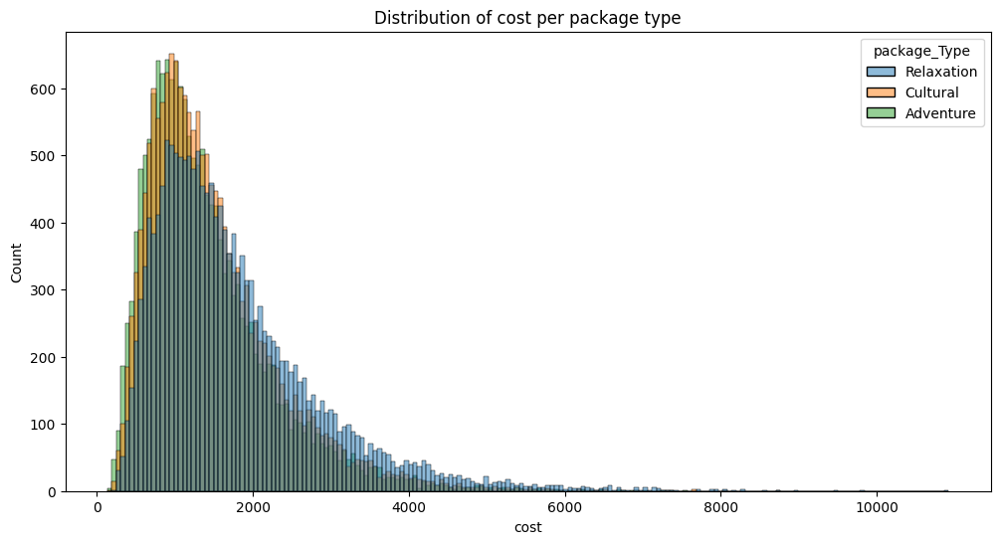

In [18]:
fig, ax = plt.subplots(figsize=(12,6))
ax.set_title("Distribution of cost per package type")
sns.histplot(travel_dataset, x="cost", hue="package_Type",ax=ax)

## Multivariate plotting with Seaborn

**Multivariate Plots: Merging Small Multiples with Color-Coding**

**The combination's Strength**:
- **Depth & Breadth**: By pairing small multiples with color-coding, you can showcase multiple data dimensions at once.
- **Rich Insights**: Great for spotting intricate patterns and trends.
  
**Challenges**:
- **Information Overload**: Can be overwhelming due to the sheer amount of data presented.
- **Clarity & Legibility**: Risk of visual clutter. Keep designs clean and distinct.

**Best Use Cases**:
- **In-depth Exploration**: Ideal for deep data dives.
- **Specialized Audiences**: Suited for experts familiar with the data or domain.
  
**Conclusion**: 
Combining small multiples with color-coding offers a detailed data view, but it's essential to consider the audience. While powerful for **exploration**, it may be too dense for general presentations (explanation).

The true power of seaborn lies within the `hue` and `color` arguments. We can use that to make powerful graphs as follows:

<Axes: title={'center': 'Additional services vs cost, separated by package type'}, xlabel='additional_services_cost', ylabel='cost'>

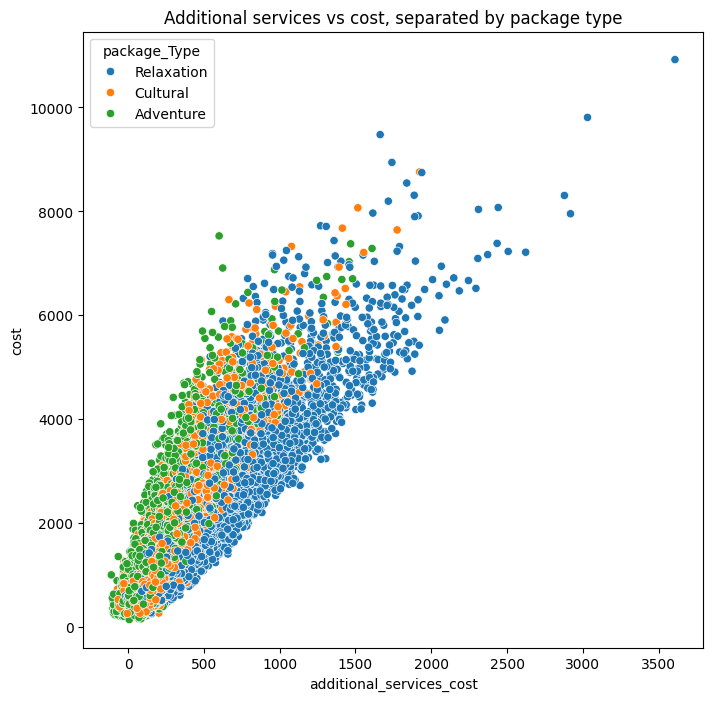

In [19]:
fig, ax = plt.subplots(figsize=(8,8))
ax.set_title("Additional services vs cost, separated by package type")
sns.scatterplot(travel_dataset, x="additional_services_cost", y="cost", hue="package_Type",ax=ax)

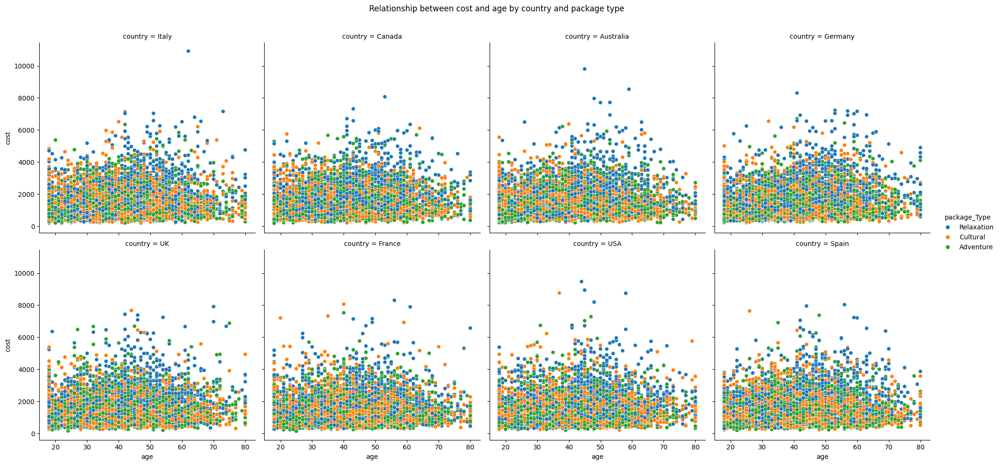

In [20]:
plot = sns.relplot(travel_dataset, x="age", y="cost", col="country", col_wrap=4, hue="package_Type");
plot.figure.suptitle("Relationship between cost and age by country and package type");
plot.figure.subplots_adjust(top=0.9) # Ensure 10 % of the space is left for the title

### Data Visualisation with Plotly 

In [21]:
px.imshow(travel_dataset[["cost","age", "stay_length", "months_before_travel", "guests"]].corr().round(3), title="correlation heatmap", width=750)

<Axes: title={'center': 'Correlation chart'}>

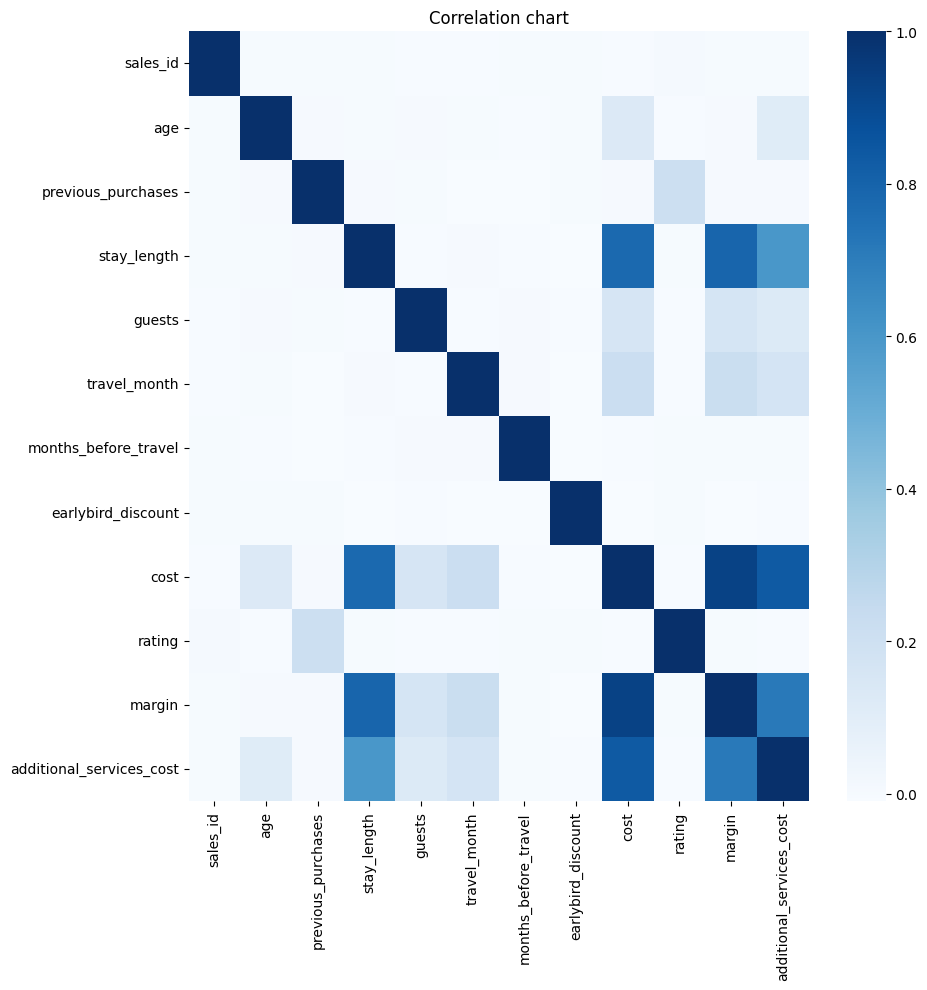

In [22]:
# alternatively 

fig, ax = plt.subplots(figsize=(10,10))
ax.set_title("Correlation chart")
sns.heatmap(travel_dataset.corr(numeric_only=True), cmap= "Blues",ax=ax)

In [23]:
px.histogram(travel_dataset, x="country", y="cost", histfunc="avg", title="Average cost per country")

In [24]:
px.histogram(travel_dataset, x="destination", y="cost", histfunc="avg", title="Average cost per destination")

In [25]:
px.histogram(travel_dataset, x="country", y="cost", histfunc="avg", title="Average cost per country, by destination (1)", color="destination", barmode="group")

In [26]:
px.histogram(travel_dataset, x="country", y="cost", histfunc="avg", title="Average cost per country, by destination (2)", facet_col="destination", width=1200)



In [27]:
px.histogram(travel_dataset, x="package_Type", title="Distribution of the package")

In [28]:
px.histogram(travel_dataset, x="package_Type", y = "cost", histfunc="avg", color="destination", barmode="group", title="Distribution of the package")

In [29]:
px.scatter(travel_dataset, x="age", y="cost")